### Introduction

In [1]:
%matplotlib inline

from __future__ import division
import os
import tensorflow as tf
import numpy as np
from nets import vgg
from matplotlib import pyplot as plt
from preprocessing import vgg_preprocessing
from libs.training import get_labels_from_annotation_batch
from scipy.misc import imread
# Load the mean pixel values and the function
# that performs the subtraction from each pixel
from preprocessing.vgg_preprocessing import (_mean_image_subtraction,
                                            _R_MEAN, _G_MEAN, _B_MEAN)
slim = tf.contrib.slim

# Data processing

In [2]:
#0:   background
#1:   roads
#2:   buildings
#255: undefined/don't care
number_of_classes = 3
class_labels = [v for v in range((number_of_classes+1))]
class_labels[-1] = 255
print(class_labels)

[0, 1, 2, 255]


In [3]:
checkpoints_dir = '/home/thalles_silva/Thalles/image-segmentation/vgg'
log_folder = '/home/thalles_silva/log_folder'
vgg_checkpoint_path = os.path.join(checkpoints_dir, 'vgg_16.ckpt')

In [4]:
def model_input():
    batch_images_placeholder = tf.placeholder(tf.float32, shape=[None, None, None, 3])
    batch_labels_placeholder = tf.placeholder(tf.float32, shape=[None, None, None])
    is_training_placeholder = tf.placeholder(tf.bool)
    return batch_images_placeholder, batch_labels_placeholder, is_training_placeholder

### Loss function definition and training using Adam Optimization Algorithm.

In [5]:
def model(processed_images, number_of_classes=21, is_training=True):
    
    with slim.arg_scope(vgg.vgg_arg_scope()):
        _, end_points = vgg.vgg_16(processed_images,
                                         num_classes=number_of_classes,
                                         is_training=True,
                                         spatial_squeeze=False,
                                         scope='vgg_16')

    input_shape = tf.shape(processed_images)

    #vgg_fc6_feature = end_points['vgg_16/fc6']

    # get the vggs pool5 feature map
    pool5_feature_map = end_points['vgg_16/pool5']
    pool5_feature_shape = tf.shape(pool5_feature_map)

    pool4_feature_map = end_points['vgg_16/pool4']
    pool4_feature_shape = tf.shape(pool4_feature_map)

    pool3_feature_map = end_points['vgg_16/pool3']
    pool3_feature_shape = tf.shape(pool3_feature_map)

    pool2_feature_map = end_points['vgg_16/pool2']
    pool2_feature_shape = tf.shape(pool2_feature_map)

    pool1_feature_map = end_points['vgg_16/pool1']
    pool1_feature_shape = tf.shape(pool1_feature_map)

    with tf.variable_scope("seg_vars"):

        # Merging Pooling 4 layer
        pool5_feature_resized = tf.image.resize_images(pool5_feature_map, 
                                                       [pool4_feature_shape[1], pool4_feature_shape[2]], method=0)
        pool5_feature_conv = slim.conv2d(pool5_feature_resized, 
                                         number_of_classes, 
                                         [1, 1], 
                                         activation_fn=None)

        pool4_feature_conv = slim.conv2d(pool4_feature_map,
                                   number_of_classes,
                                   [1, 1],
                                   activation_fn=None,
                                   normalizer_fn=None,
                                   weights_initializer=tf.zeros_initializer,
                                   scope='seg_vars/pool4')

        pool5_conv_plus_poo4_conv = pool5_feature_conv + pool4_feature_conv

        # Merging Pooling 3 layer
        pool4_feature_resized = tf.image.resize_images(pool5_conv_plus_poo4_conv, 
                                                       (pool3_feature_shape[1], pool3_feature_shape[2]), method=0)
        
        pool4_feature_conv = slim.conv2d(pool4_feature_resized, 
                                         number_of_classes, 
                                         [1, 1], 
                                         activation_fn=None)


        pool3_feature_conv = slim.conv2d(pool3_feature_map,
                                   number_of_classes,
                                   [1, 1],
                                   activation_fn=None,
                                   normalizer_fn=None,
                                   weights_initializer=tf.zeros_initializer,
                                   scope='seg_vars/pool3')

        pool4_conv_plus_pool3_conv = pool4_feature_conv + pool3_feature_conv

        # Merging Pooling 2 layer
        pool3_feature_resized = tf.image.resize_images(pool4_conv_plus_pool3_conv, 
                                                       (pool2_feature_shape[1], pool2_feature_shape[2]), method=0)
        
        pool3_feature_conv = slim.conv2d(pool3_feature_resized, 
                                         number_of_classes, 
                                         [1, 1],
                                         activation_fn=None)

        pool2_feature_conv = slim.conv2d(pool2_feature_map,
                               number_of_classes,
                               [1, 1],
                               activation_fn=None,
                               normalizer_fn=None,
                               weights_initializer=tf.zeros_initializer)

        pool3_conv_plus_pool2_conv = pool3_feature_conv + pool2_feature_conv

        # Merging Pooling1 layer
        pool2_feature_resized = tf.image.resize_images(pool3_conv_plus_pool2_conv, 
                                                       (pool1_feature_shape[1], pool1_feature_shape[2]), method=0)
        
        pool2_feature_conv = slim.conv2d(pool2_feature_resized, 
                                         number_of_classes, 
                                         [1, 1], 
                                         activation_fn=None)

        pool1_feature_conv = slim.conv2d(pool1_feature_map,
                               number_of_classes,
                               [1, 1],
                               activation_fn=None,
                               normalizer_fn=None,
                               weights_initializer=tf.zeros_initializer)

        pool2_conv_plus_pool1_conv = pool2_feature_conv + pool1_feature_conv

        # Resize to original image shape
        orignal_image_shape = tf.image.resize_images(pool2_conv_plus_pool1_conv, 
                                                       (input_shape[1], input_shape[2]), method=0)
        
        orignal_image_logits = slim.conv2d(orignal_image_shape, 
                                         number_of_classes, 
                                         [1, 1], 
                                         activation_fn=None)

        return orignal_image_logits

In [6]:
def model_loss(logits, labels, class_labels):
    annotation_mask = get_labels_from_annotation_batch(labels, class_labels)
    cross_entropies = tf.nn.softmax_cross_entropy_with_logits(logits=logits,
                                                              labels=annotation_mask)

    cross_entropy_mean = tf.reduce_mean(cross_entropies)
    
    # Add summary op for the loss -- to be able to see it in tensorboard.
    tf.summary.scalar('cross_entropy_loss', cross_entropy_mean)

    # Tensor to get the final prediction for each pixel -- pay 
    # attention that we don't need softmax in this case because
    # we only need the final decision. If we also need the respective
    # probabilities we will have to apply softmax.
    pred = tf.argmax(logits, dimension=3)
    probabilities = tf.nn.softmax(logits)
    
    return cross_entropy_mean, pred, probabilities

In [7]:
def model_optimizer(cross_entropy_sum, learning_rate):
    with tf.variable_scope("adam_vars"):
        #with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        train_step = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cross_entropy_sum)
    return train_step

In [8]:
total_epochs = 30
batch_size = 20
image_size=[384, 384]

In [9]:
def read_image_and_annotation(train_images_dir, train_annotations_dir, image_name):
    # read the input and annotation images
    image = imread(train_images_dir + image_name.strip() + ".tiff")
    annotation = imread(train_annotations_dir + image_name.strip() + ".tif")
    assert (image.dtype) == "uint8"
    assert (annotation.dtype) == "uint8"
    return image, annotation

In [10]:
def random_crop(image_np, annotation_np, crop_size=128):
    """
    image_np: rgb image shape (H,W,3)
    annotation_np: 1D image shape (H,W,1)
    crop_size: integer
    """
    image_h = image_np.shape[0]
    image_w = image_np.shape[1]
    
    random_x = np.random.randint(0, image_w-crop_size+1) # Return random integers from low (inclusive) to high (exclusive).
    random_y = np.random.randint(0, image_h-crop_size+1) # Return random integers from low (inclusive) to high (exclusive).
    
    offset_x = random_x + crop_size
    offset_y = random_y + crop_size
    
    return image_np[random_x:offset_x, random_y:offset_y,:], annotation_np[random_x:offset_x, random_y:offset_y]

In [11]:
def next_batch(train_images_dir, train_annotations_dir, image_filenames_list, batch_size=5, crop_size=128):
    
    for image_name in image_filenames_list:
        
        image_np, annotation_np = read_image_and_annotation(train_images_dir, train_annotations_dir, image_name)
            
        batch_images = None
        batch_labels = None
        
        for batch_i in range(batch_size):
            cropped_image, cropped_annotation = random_crop(image_np, annotation_np, crop_size)
            cropped_image = np.expand_dims(cropped_image, axis=0)
            cropped_annotation = np.expand_dims(cropped_annotation, axis=0)
            
            if batch_images is None:
                batch_images = cropped_image
                batch_labels = cropped_annotation
            else:
                #print(batch_images.shape, cropped_image.shape)
                batch_images = np.concatenate((batch_images, cropped_image), axis=0)
                batch_labels = np.concatenate((batch_labels, cropped_annotation), axis=0)
    
        yield batch_images, batch_labels

In [12]:
batch_images_placeholder, batch_labels_placeholder, is_training_placeholder = model_input()

logits = model(batch_images_placeholder, number_of_classes=number_of_classes, is_training=is_training_placeholder)

cross_entropy, pred, probabilities = model_loss(logits, batch_labels_placeholder, class_labels)

train_step = model_optimizer(cross_entropy, learning_rate=0.00001)

In [13]:
# Define the accuracy metric: Mean Intersection Over Union
miou, update_op = slim.metrics.streaming_mean_iou(predictions=pred,
                                                   labels=batch_labels_placeholder,
                                                   num_classes=number_of_classes)

In [14]:
# get all segmentation model vars, these are the variables we create to perform 
# the segmentation upsampling layers
model_variables = [ var.op.name for var in slim.get_variables(scope="seg_vars") ]

# Now we define a function that will load the weights from VGG checkpoint
# into our variables when we call it. We exclude the weights from the last layer
# which is responsible for class predictions. We do this because 
# we will have different number of classes to predict and we can't
# use the old ones as an initialization.
exclude_vars = model_variables + ['vgg_16/fc8', 'adam_vars']
vgg_except_fc8_weights = slim.get_variables_to_restore(exclude=exclude_vars)

# Here we get variables that belong to the last layer of network.
# As we saw, the number of classes that VGG was originally trained on
# is different from ours -- in our case it is only 2 classes.
vgg_fc8_weights = slim.get_variables_to_restore(include=['vgg_16/fc8'])

adam_optimizer_variables = slim.get_variables_to_restore(include=['adam_vars'])

# get the segmentation upsampling variables to be initialized 
model_variables = slim.get_variables(scope="seg_vars")

# Put all summary ops into one op. Produces string when you run it.
merged_summary_op = tf.summary.merge_all()

# Create the summary writer -- to write all the logs
# into a specified file. This file can be later read
# by tensorboard.
summary_string_writer = tf.summary.FileWriter(log_folder)

# Create the log folder if doesn't exist yet
if not os.path.exists(log_folder):
    os.makedirs(log_folder)

# Create an OP that performs the initialization of
# the VGG net variables.
read_vgg_weights_except_fc8_func = slim.assign_from_checkpoint_fn(
                                   vgg_checkpoint_path,
                                   vgg_except_fc8_weights)

In [15]:
base_dataset_dir = "./road_and_buildings"
train_images_dir = os.path.join(base_dataset_dir, "images/")
train_annotations_dir = os.path.join(base_dataset_dir, "labels/")

In [16]:
file = open(os.path.join(base_dataset_dir, "train.txt"), 'r')
images_filenale_list = [line for line in file]
print(images_filenale_list)

['22678915_15\n', '22678930_15\n', '22678945_15\n']


INFO:tensorflow:Restoring parameters from /home/thalles_silva/Thalles/image-segmentation/vgg/vgg_16.ckpt
Epoch: 0 	Train step: 3 	Traing Loss: 1.21583 	mIOU: 0.256389


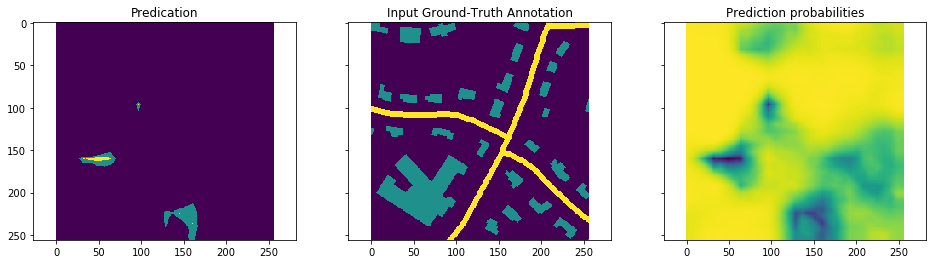

Epoch: 1 	Train step: 6 	Traing Loss: 1.28142 	mIOU: 0.273697


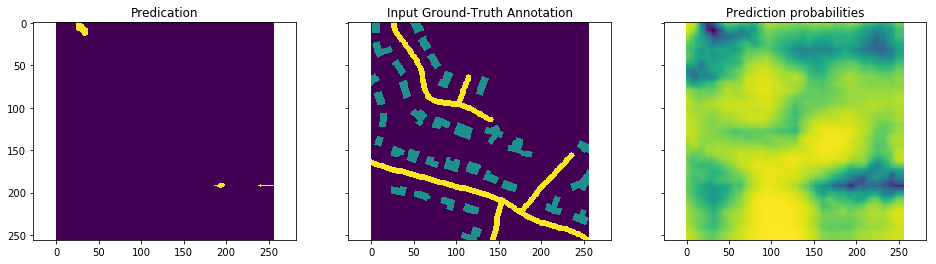

Epoch: 2 	Train step: 9 	Traing Loss: 0.904435 	mIOU: 0.277406


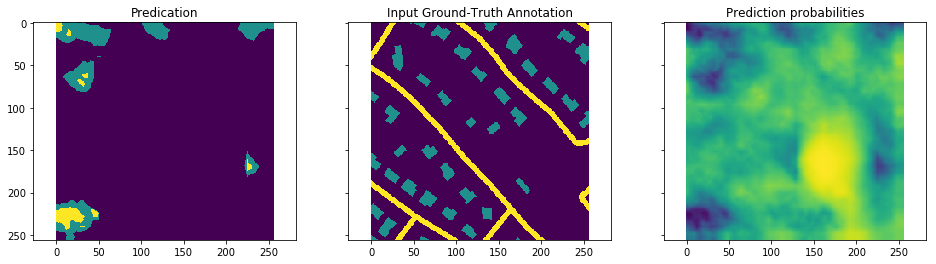

Epoch: 3 	Train step: 12 	Traing Loss: 0.89133 	mIOU: 0.27985


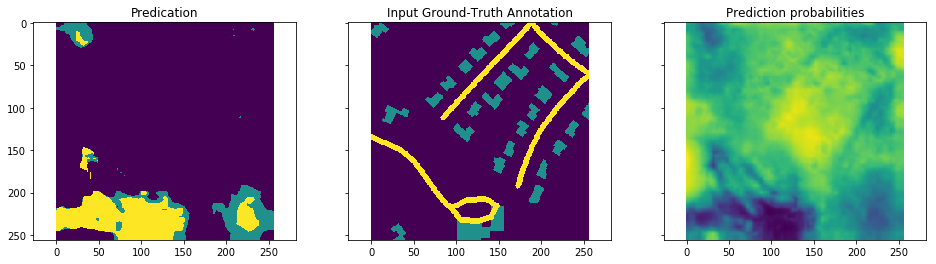

Epoch: 4 	Train step: 15 	Traing Loss: 0.774088 	mIOU: 0.283326


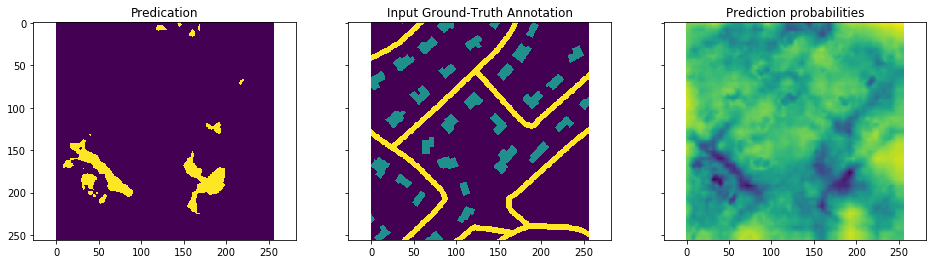

Epoch: 5 	Train step: 18 	Traing Loss: 0.666922 	mIOU: 0.285318


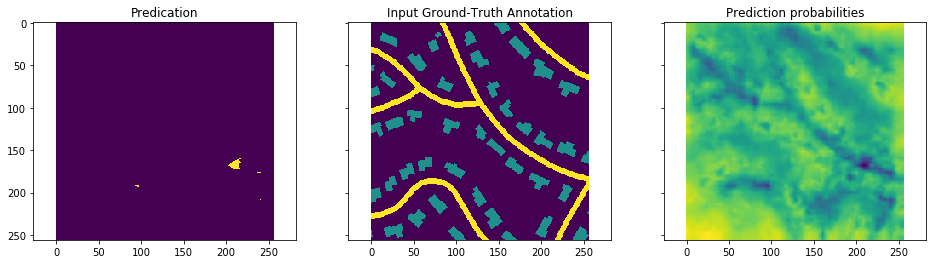

Epoch: 6 	Train step: 21 	Traing Loss: 0.629839 	mIOU: 0.286071


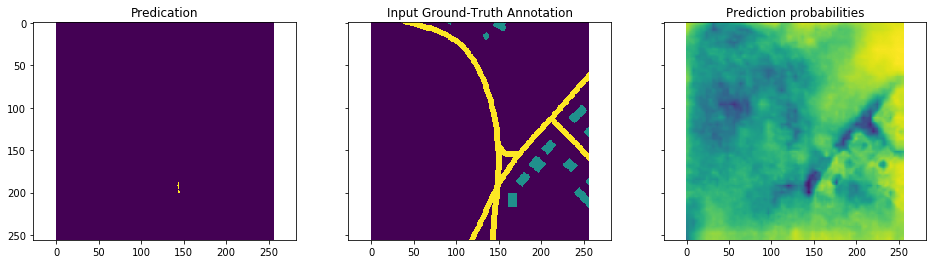

Epoch: 7 	Train step: 24 	Traing Loss: 0.60192 	mIOU: 0.287832


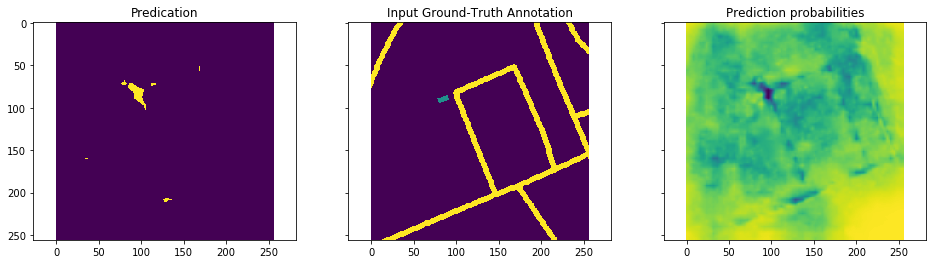

Epoch: 8 	Train step: 27 	Traing Loss: 0.612125 	mIOU: 0.291702


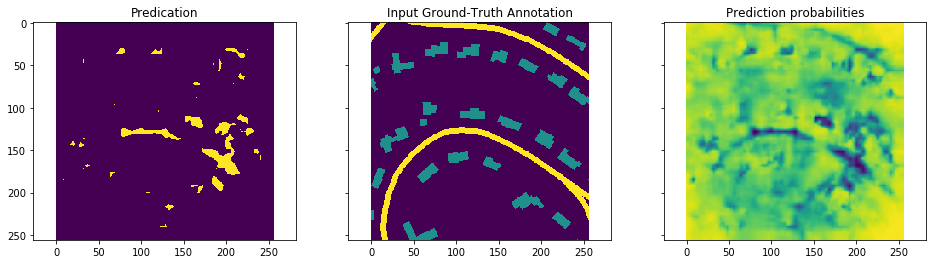

Epoch: 9 	Train step: 30 	Traing Loss: 0.605324 	mIOU: 0.294696


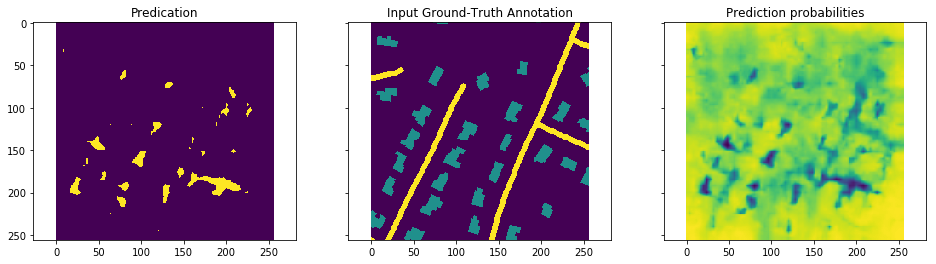

Epoch: 10 	Train step: 33 	Traing Loss: 0.523108 	mIOU: 0.297006


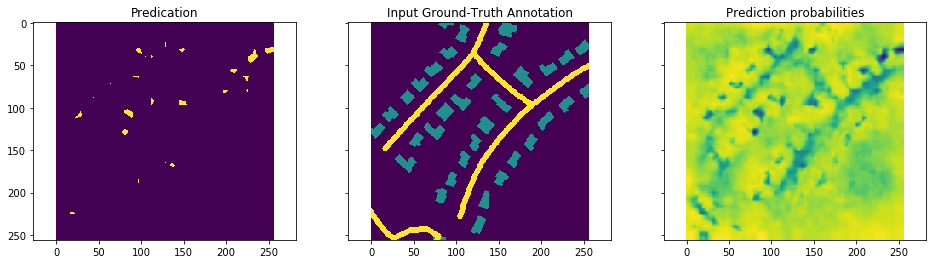

Epoch: 11 	Train step: 36 	Traing Loss: 0.523233 	mIOU: 0.298437


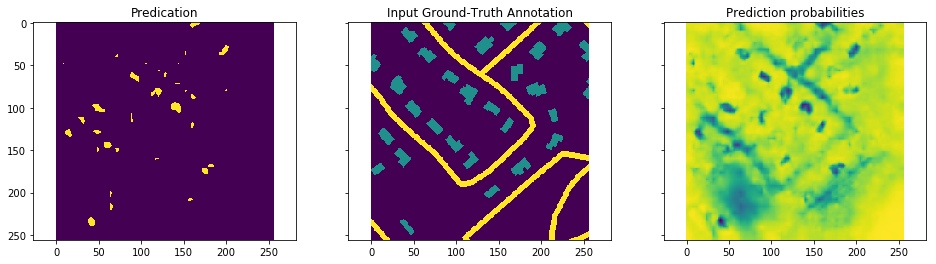

Epoch: 12 	Train step: 39 	Traing Loss: 0.504671 	mIOU: 0.30116


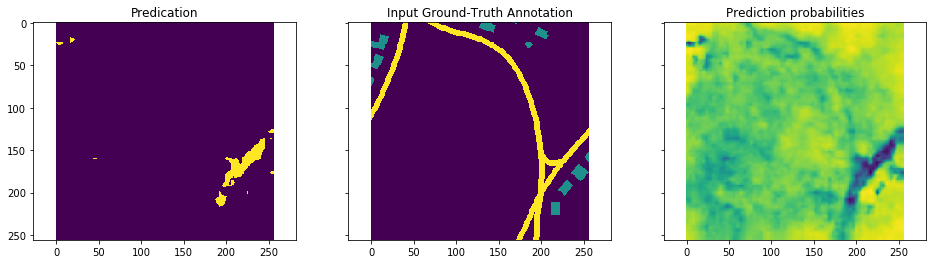

Epoch: 13 	Train step: 42 	Traing Loss: 0.533528 	mIOU: 0.303955


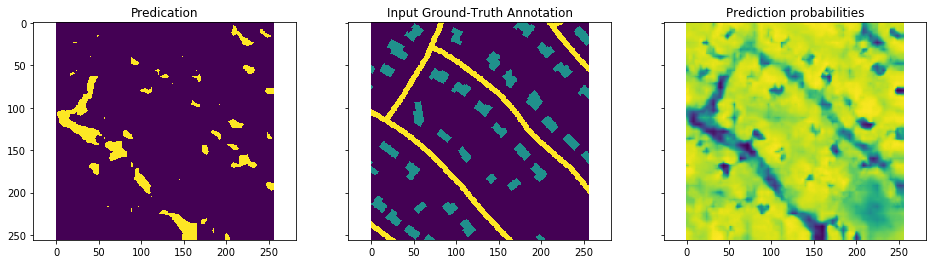

Epoch: 14 	Train step: 45 	Traing Loss: 0.504846 	mIOU: 0.305893


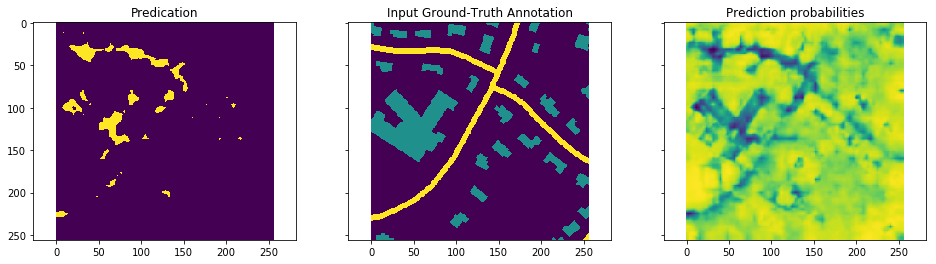

Epoch: 15 	Train step: 48 	Traing Loss: 0.532472 	mIOU: 0.307098


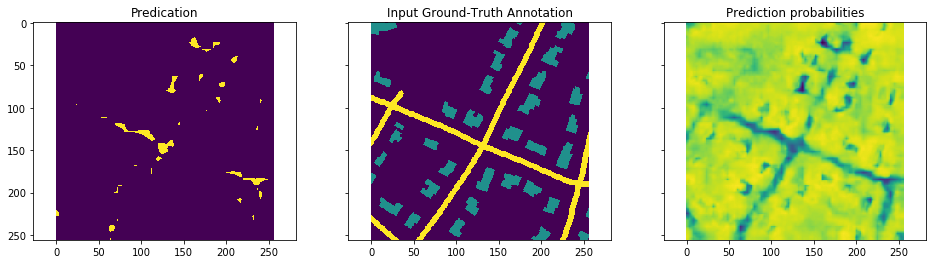

Epoch: 16 	Train step: 51 	Traing Loss: 0.517987 	mIOU: 0.309102


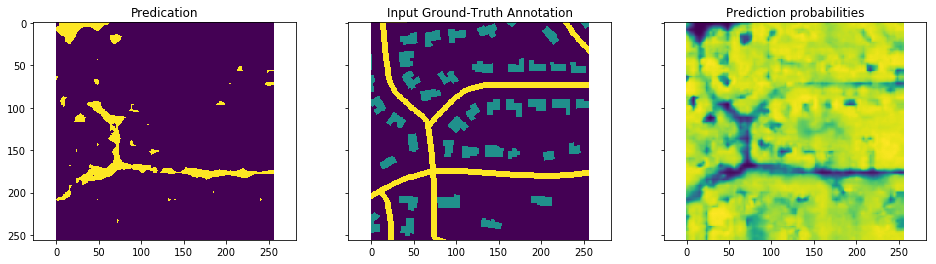

Epoch: 17 	Train step: 54 	Traing Loss: 0.48226 	mIOU: 0.311432


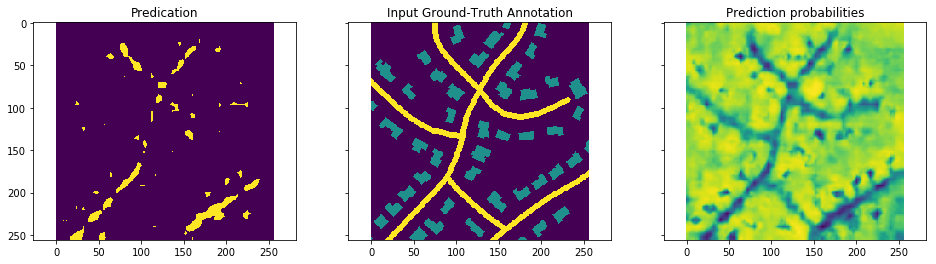

Epoch: 18 	Train step: 57 	Traing Loss: 0.481207 	mIOU: 0.312303


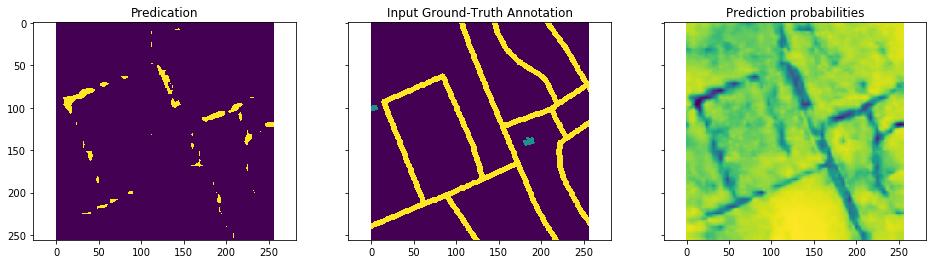

Epoch: 19 	Train step: 60 	Traing Loss: 0.49091 	mIOU: 0.31424


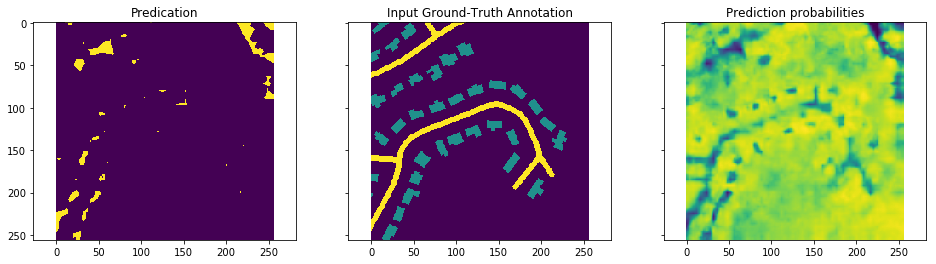

Epoch: 20 	Train step: 63 	Traing Loss: 0.47961 	mIOU: 0.316246


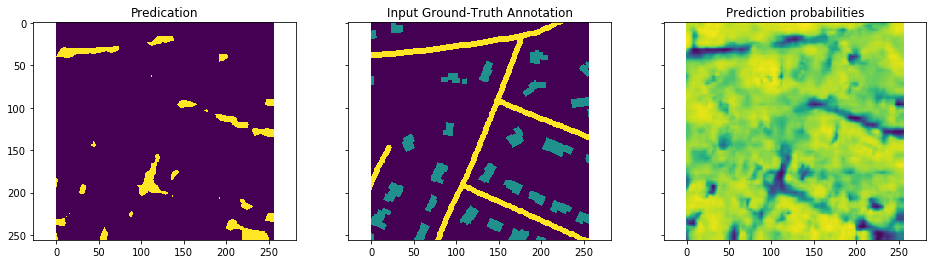

Epoch: 21 	Train step: 66 	Traing Loss: 0.4724 	mIOU: 0.317365


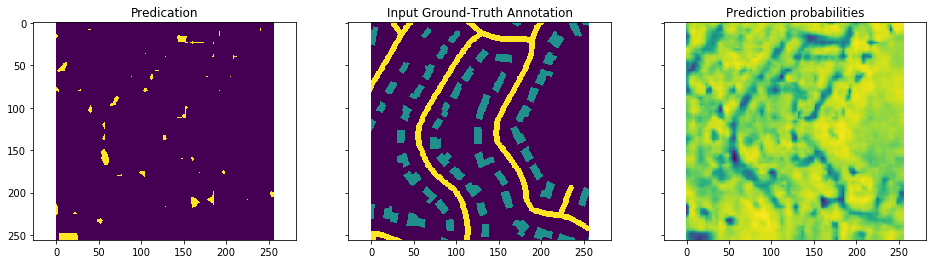

Epoch: 22 	Train step: 69 	Traing Loss: 0.446866 	mIOU: 0.318467


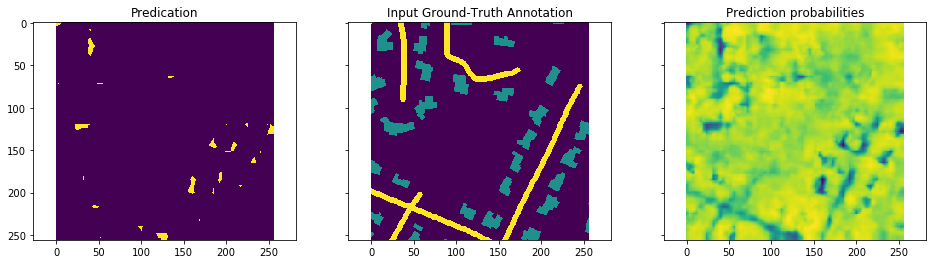

Epoch: 23 	Train step: 72 	Traing Loss: 0.466786 	mIOU: 0.320016


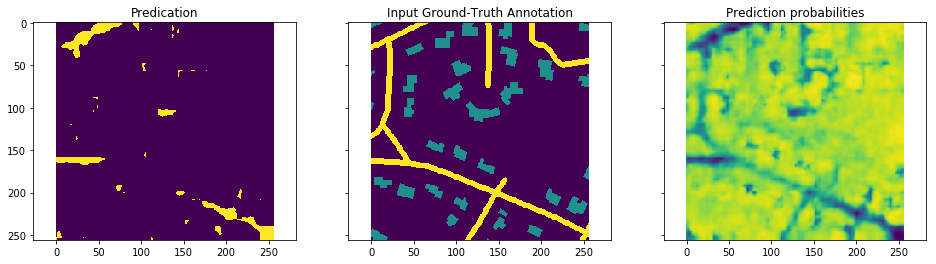

Epoch: 24 	Train step: 75 	Traing Loss: 0.419778 	mIOU: 0.321852


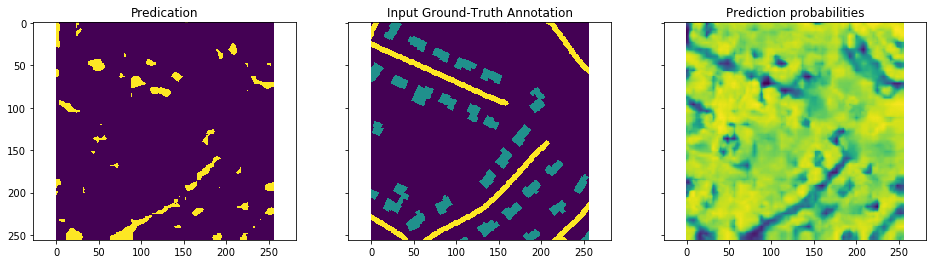

Epoch: 25 	Train step: 78 	Traing Loss: 0.469894 	mIOU: 0.322842


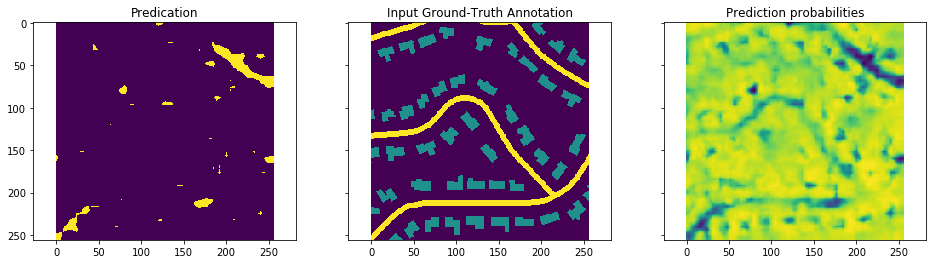

Epoch: 26 	Train step: 81 	Traing Loss: 0.45679 	mIOU: 0.324105


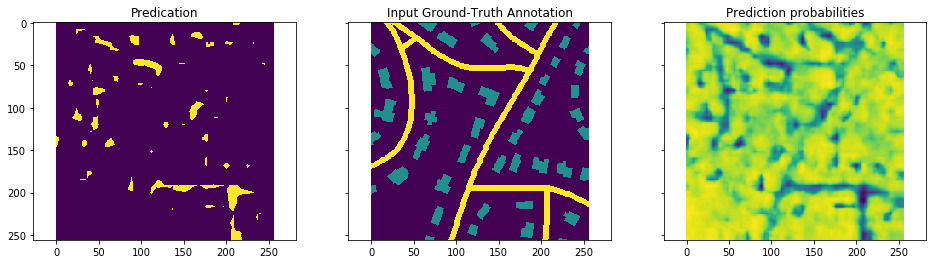

Epoch: 27 	Train step: 84 	Traing Loss: 0.423773 	mIOU: 0.325884


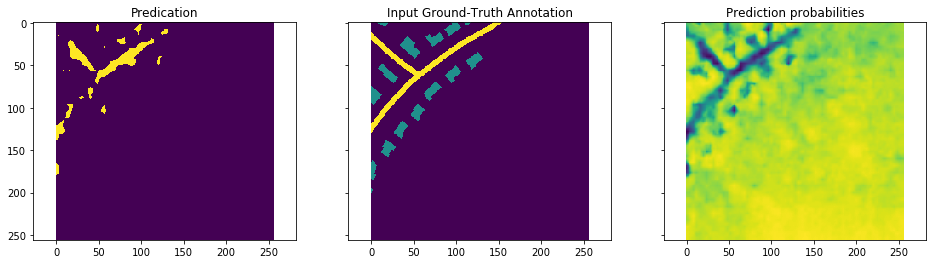

Epoch: 28 	Train step: 87 	Traing Loss: 0.433075 	mIOU: 0.327081


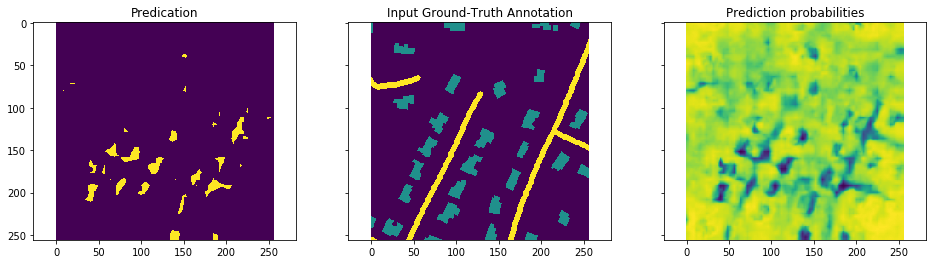

Epoch: 29 	Train step: 90 	Traing Loss: 0.452796 	mIOU: 0.328371


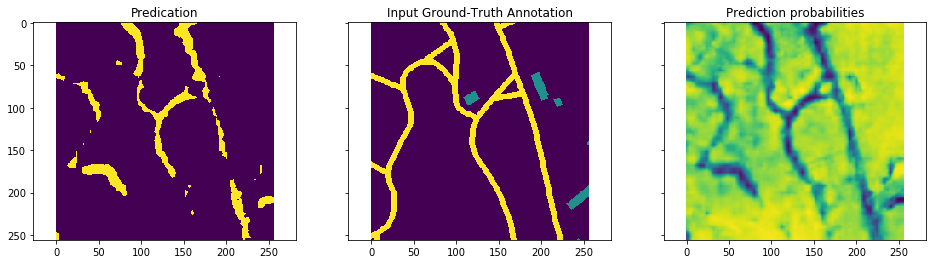

Epoch: 30 	Train step: 93 	Traing Loss: 0.438586 	mIOU: 0.329711


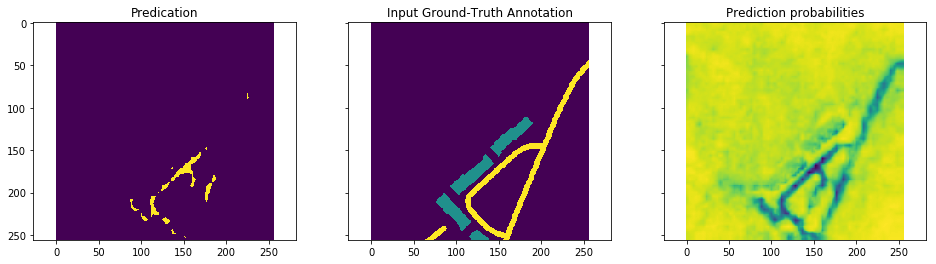

Epoch: 31 	Train step: 96 	Traing Loss: 0.447474 	mIOU: 0.330912


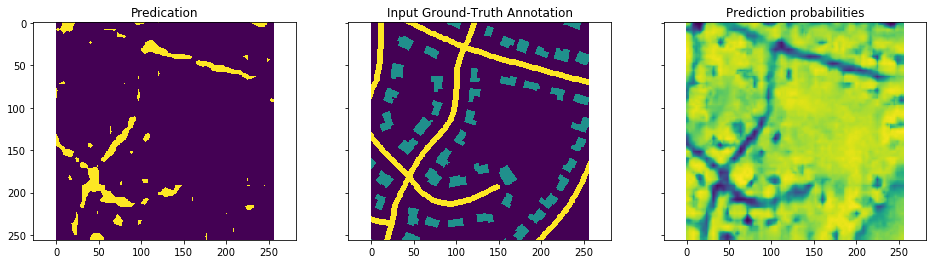

Epoch: 32 	Train step: 99 	Traing Loss: 0.453092 	mIOU: 0.331848


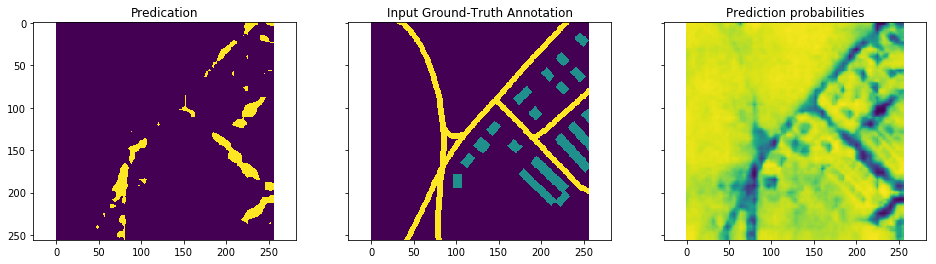

Epoch: 33 	Train step: 102 	Traing Loss: 0.425063 	mIOU: 0.332824


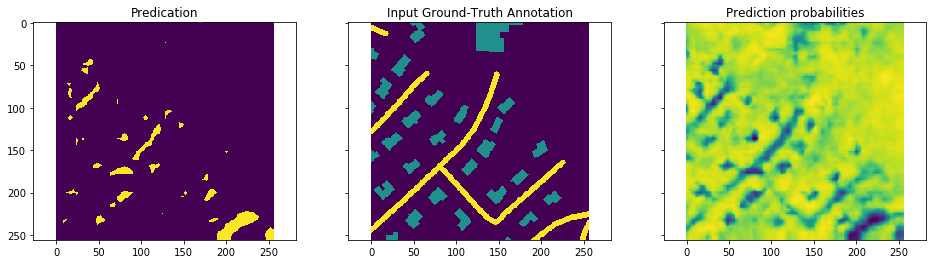

Epoch: 34 	Train step: 105 	Traing Loss: 0.452542 	mIOU: 0.333663


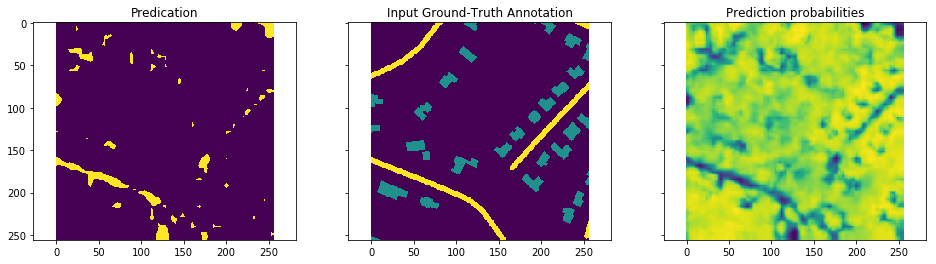

Epoch: 35 	Train step: 108 	Traing Loss: 0.390945 	mIOU: 0.334854


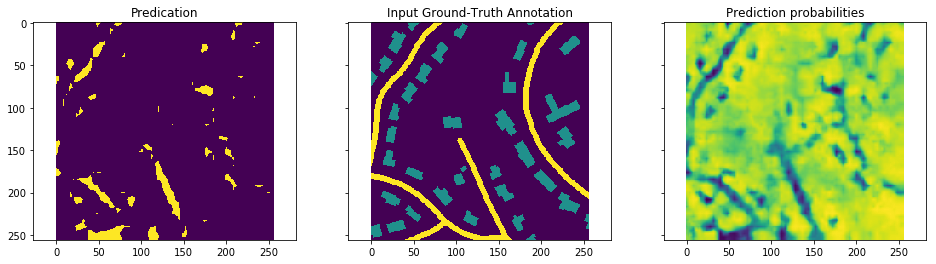

Epoch: 36 	Train step: 111 	Traing Loss: 0.431384 	mIOU: 0.335876


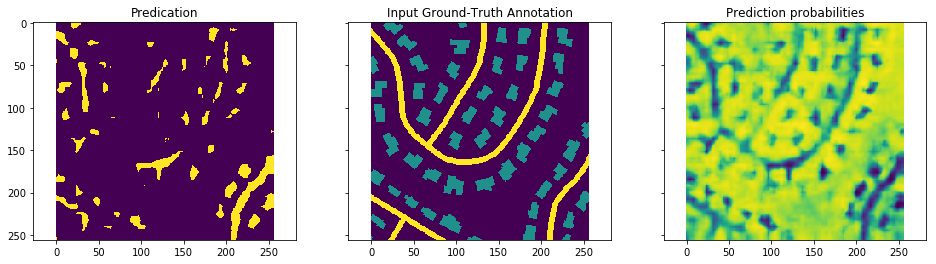

Epoch: 37 	Train step: 114 	Traing Loss: 0.392383 	mIOU: 0.336876


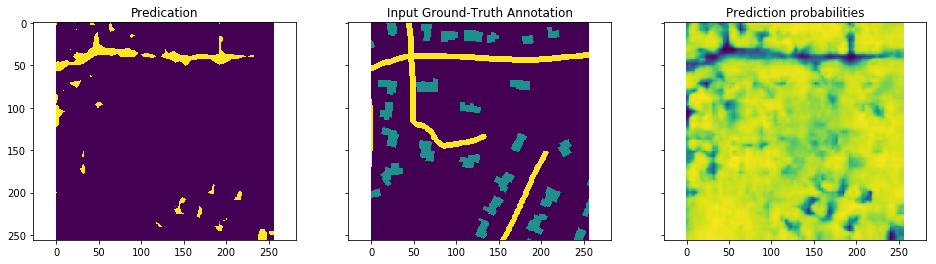

Epoch: 38 	Train step: 117 	Traing Loss: 0.413936 	mIOU: 0.337998


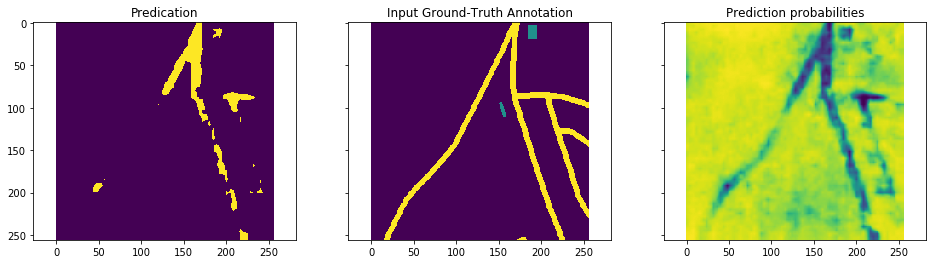

Epoch: 39 	Train step: 120 	Traing Loss: 0.39033 	mIOU: 0.338975


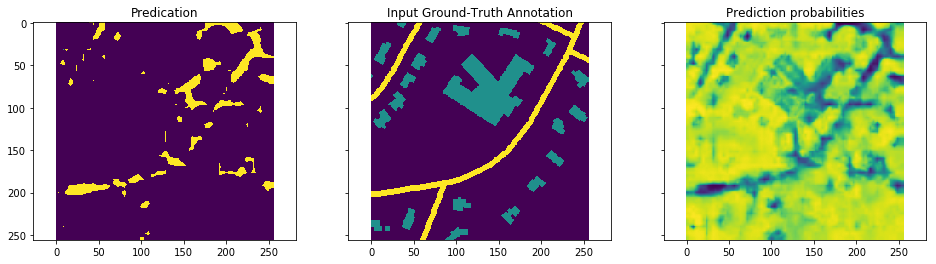

Epoch: 40 	Train step: 123 	Traing Loss: 0.425612 	mIOU: 0.340057


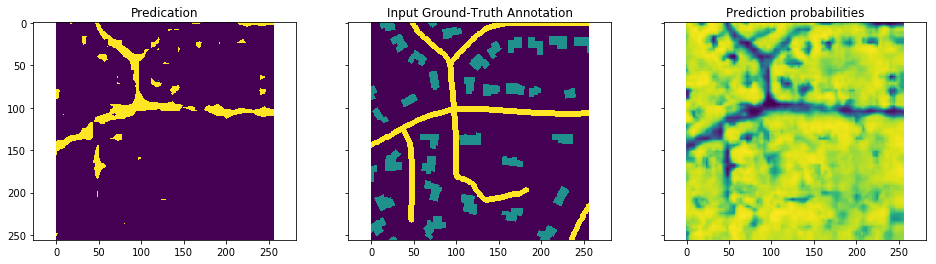

Epoch: 41 	Train step: 126 	Traing Loss: 0.412979 	mIOU: 0.340881


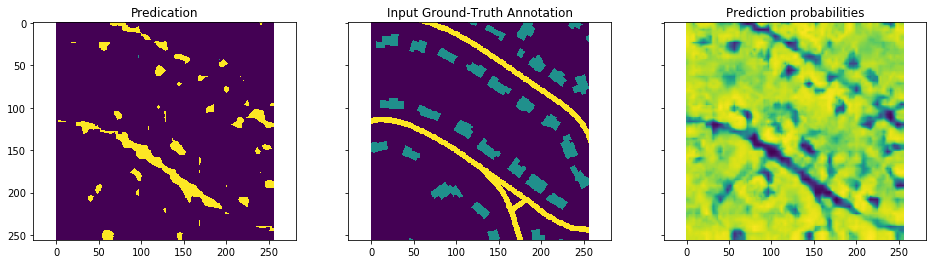

Epoch: 42 	Train step: 129 	Traing Loss: 0.386147 	mIOU: 0.341794


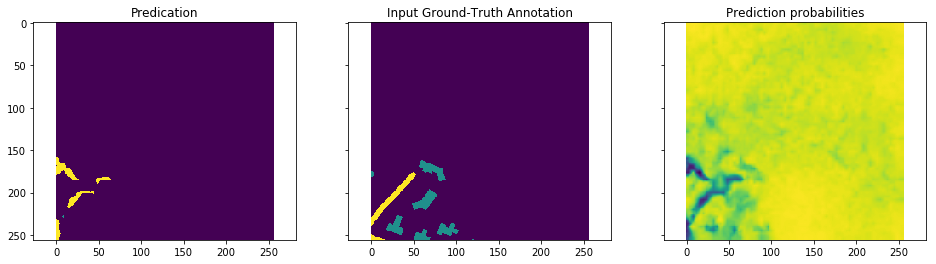

Epoch: 43 	Train step: 132 	Traing Loss: 0.359456 	mIOU: 0.3427


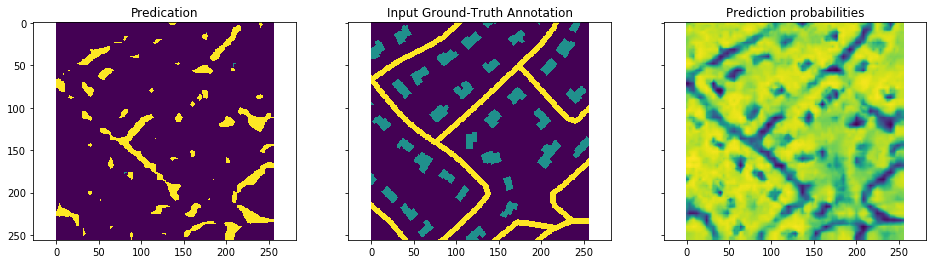

Epoch: 44 	Train step: 135 	Traing Loss: 0.412307 	mIOU: 0.343778


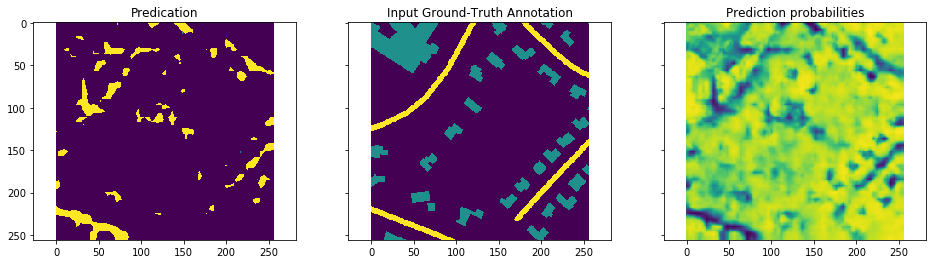

Epoch: 45 	Train step: 138 	Traing Loss: 0.410215 	mIOU: 0.34463


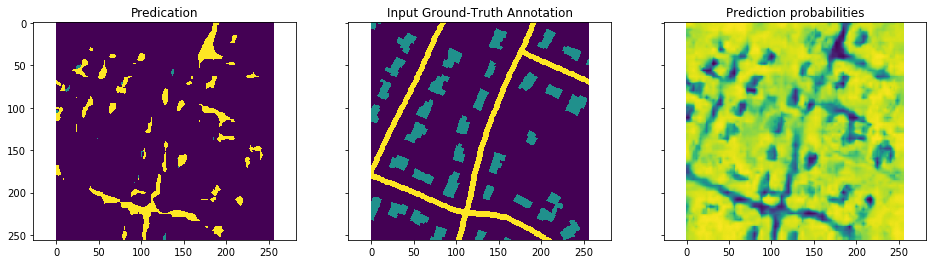

Epoch: 46 	Train step: 141 	Traing Loss: 0.402698 	mIOU: 0.345415


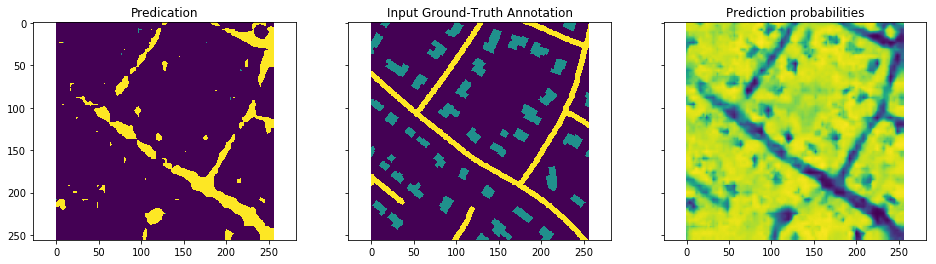

Epoch: 47 	Train step: 144 	Traing Loss: 0.423699 	mIOU: 0.346317


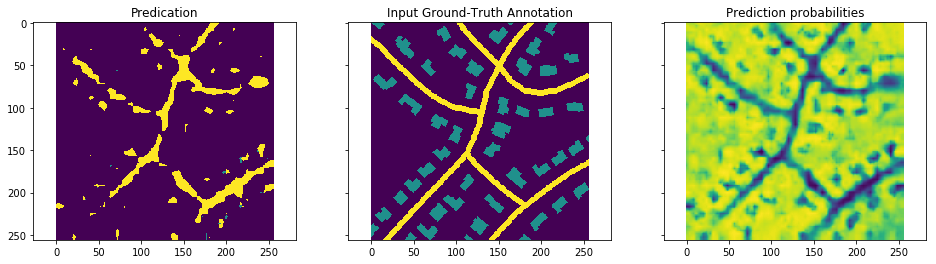

Epoch: 48 	Train step: 147 	Traing Loss: 0.392982 	mIOU: 0.347119


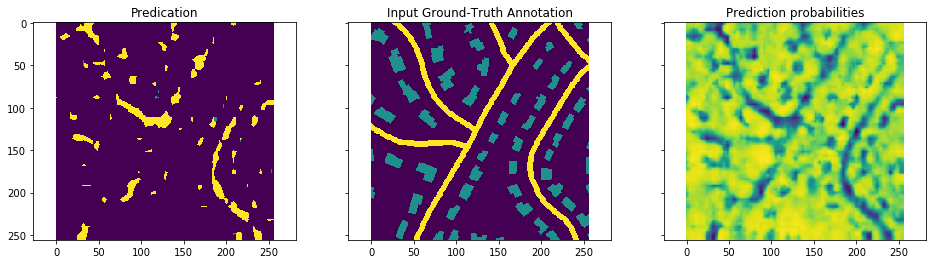

Epoch: 49 	Train step: 150 	Traing Loss: 0.404773 	mIOU: 0.347957


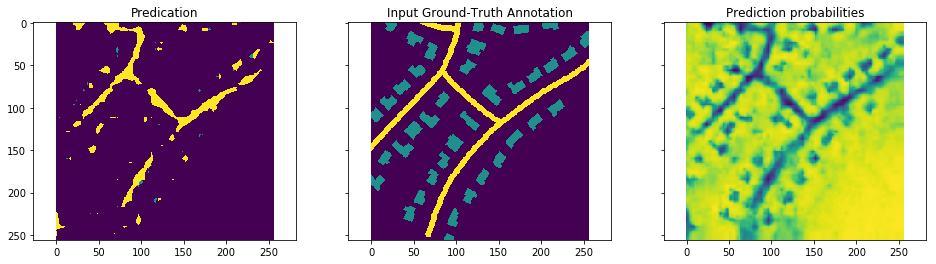

Epoch: 50 	Train step: 153 	Traing Loss: 0.403955 	mIOU: 0.34883


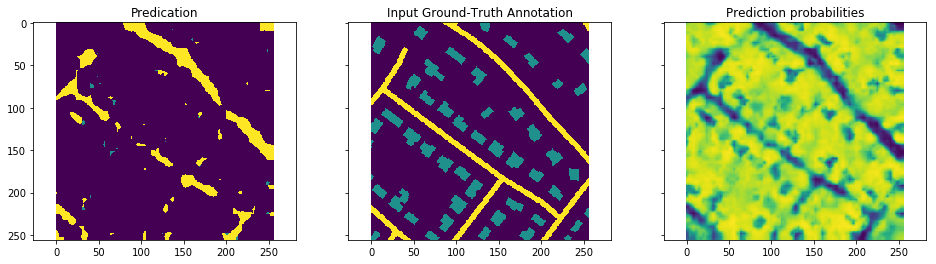

Epoch: 51 	Train step: 156 	Traing Loss: 0.379476 	mIOU: 0.349639


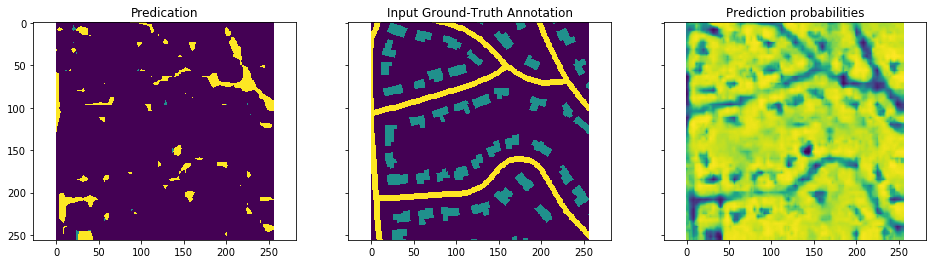

Epoch: 52 	Train step: 159 	Traing Loss: 0.361987 	mIOU: 0.350502


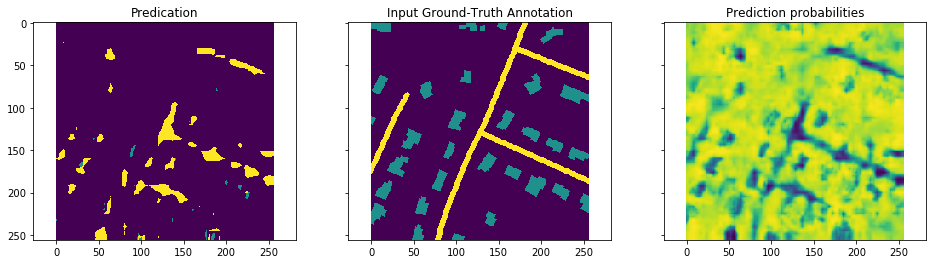

Epoch: 53 	Train step: 162 	Traing Loss: 0.375363 	mIOU: 0.351372


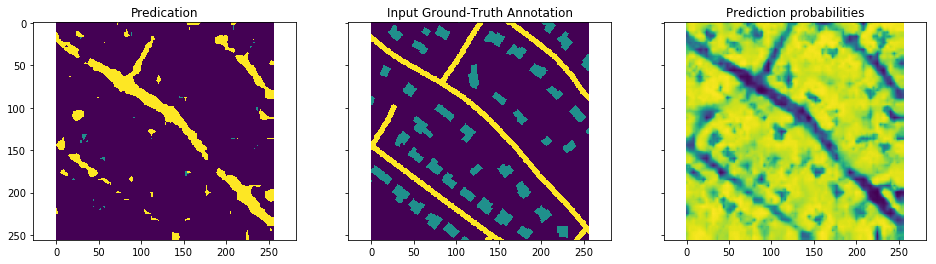

Epoch: 54 	Train step: 165 	Traing Loss: 0.354264 	mIOU: 0.352198


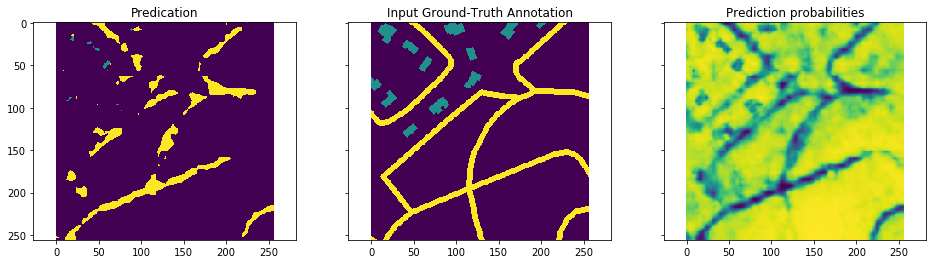

Epoch: 55 	Train step: 168 	Traing Loss: 0.385296 	mIOU: 0.352842


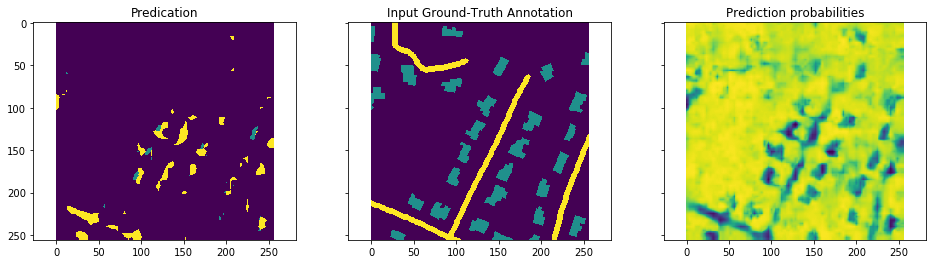

Epoch: 56 	Train step: 171 	Traing Loss: 0.408101 	mIOU: 0.353828


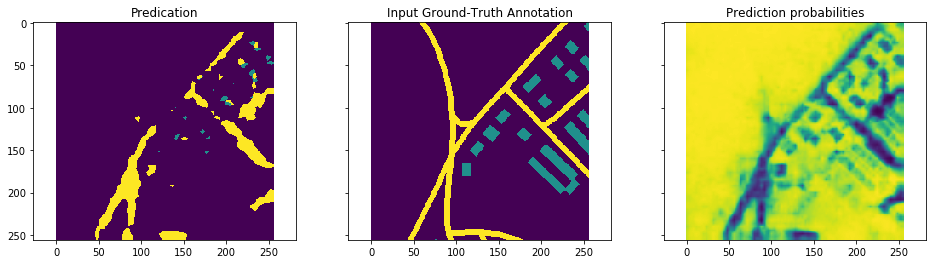

Epoch: 57 	Train step: 174 	Traing Loss: 0.408846 	mIOU: 0.354663


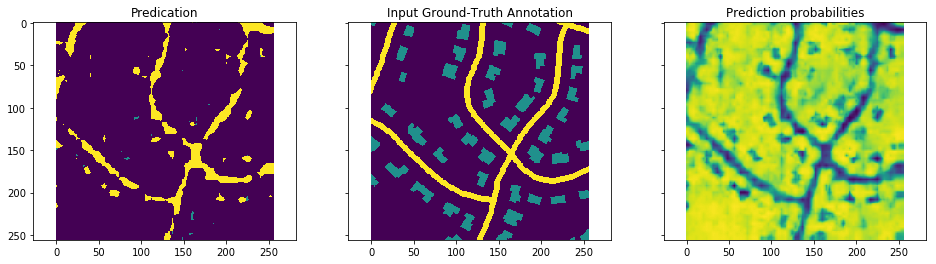

Epoch: 58 	Train step: 177 	Traing Loss: 0.369889 	mIOU: 0.355603


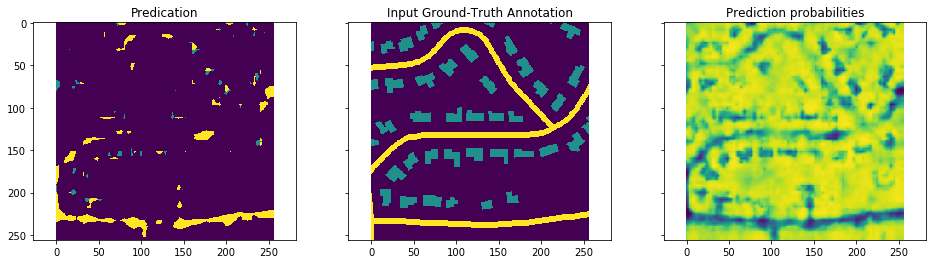

Epoch: 59 	Train step: 180 	Traing Loss: 0.338929 	mIOU: 0.35654


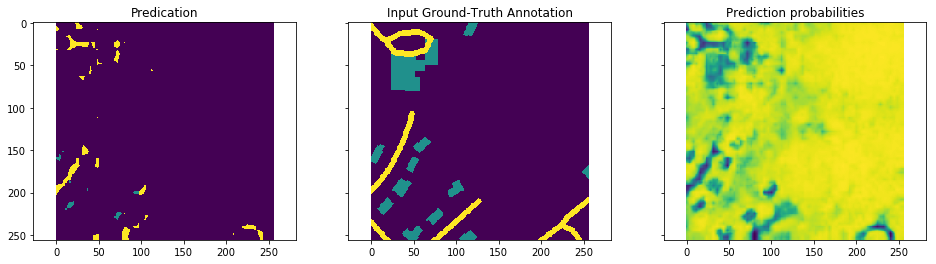

Epoch: 60 	Train step: 183 	Traing Loss: 0.352513 	mIOU: 0.35732


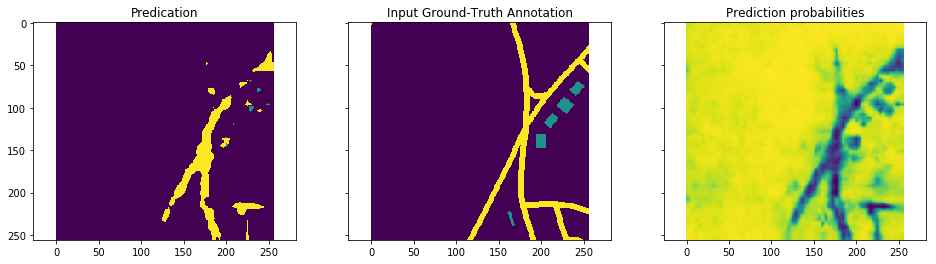

Epoch: 61 	Train step: 186 	Traing Loss: 0.380326 	mIOU: 0.358087


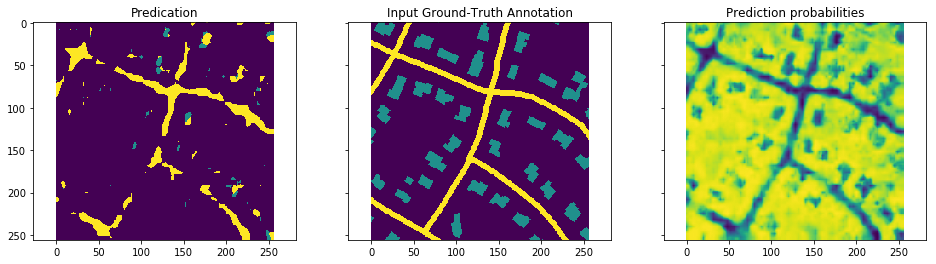

Epoch: 62 	Train step: 189 	Traing Loss: 0.373283 	mIOU: 0.358857


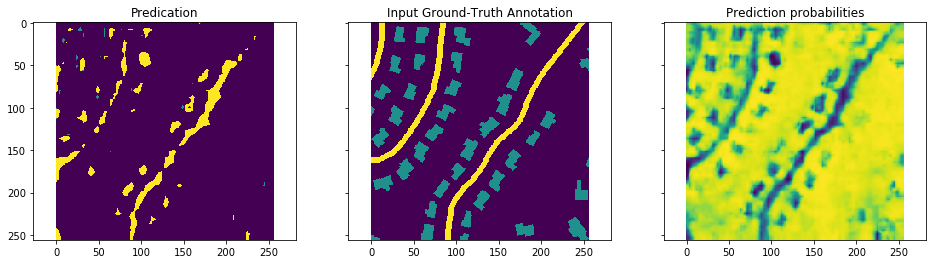

Epoch: 63 	Train step: 192 	Traing Loss: 0.349662 	mIOU: 0.359636


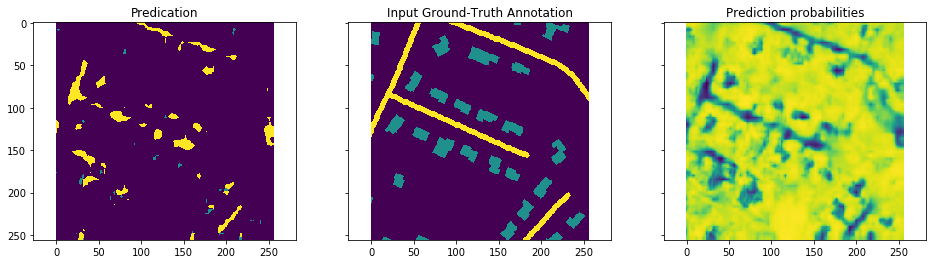

Epoch: 64 	Train step: 195 	Traing Loss: 0.355531 	mIOU: 0.36044


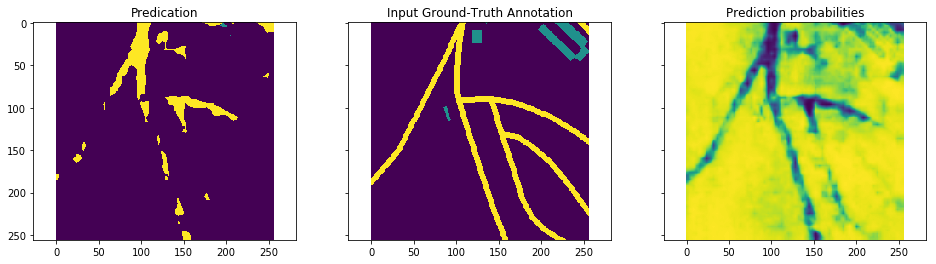

Epoch: 65 	Train step: 198 	Traing Loss: 0.391745 	mIOU: 0.361272


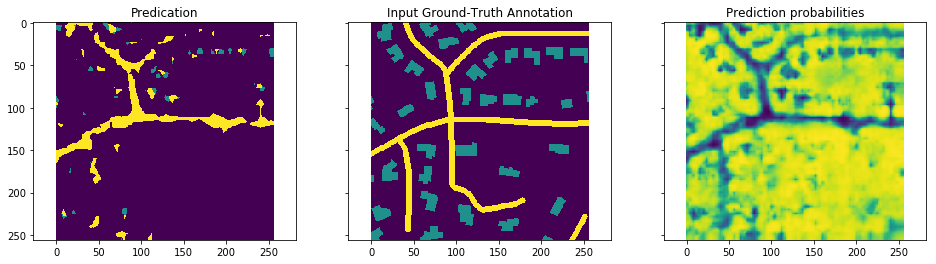

Epoch: 66 	Train step: 201 	Traing Loss: 0.340511 	mIOU: 0.362217


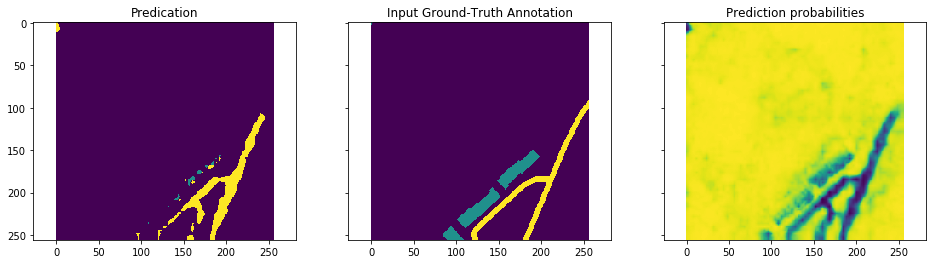

Epoch: 67 	Train step: 204 	Traing Loss: 0.357549 	mIOU: 0.363094


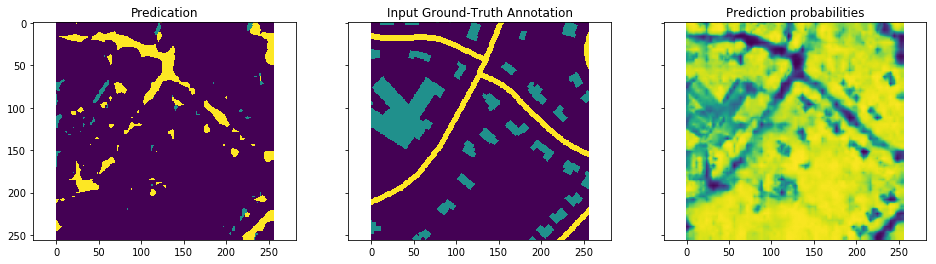

Epoch: 68 	Train step: 207 	Traing Loss: 0.368117 	mIOU: 0.36416


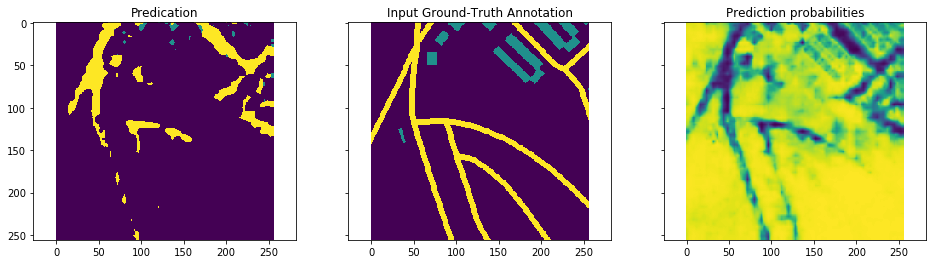

Epoch: 69 	Train step: 210 	Traing Loss: 0.333916 	mIOU: 0.365044


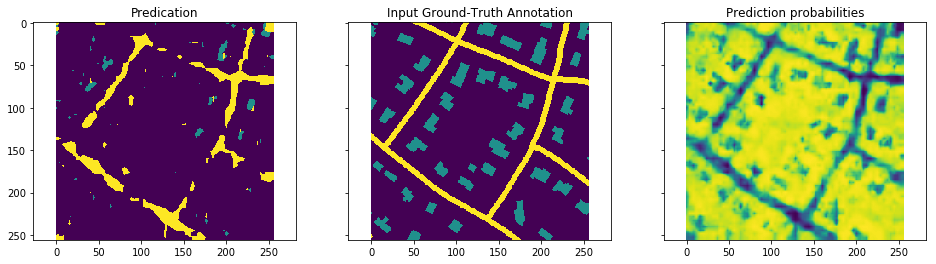

Epoch: 70 	Train step: 213 	Traing Loss: 0.328915 	mIOU: 0.365915


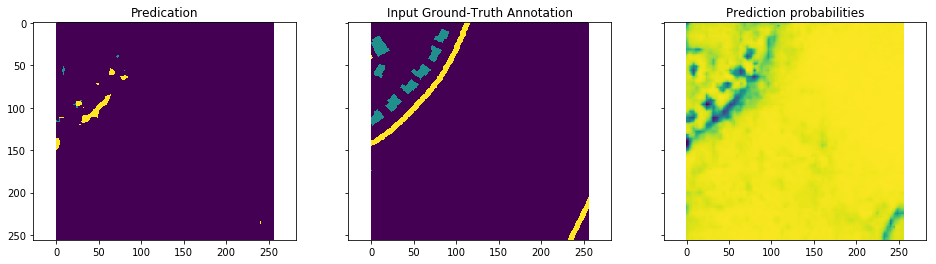

Epoch: 71 	Train step: 216 	Traing Loss: 0.383448 	mIOU: 0.366937


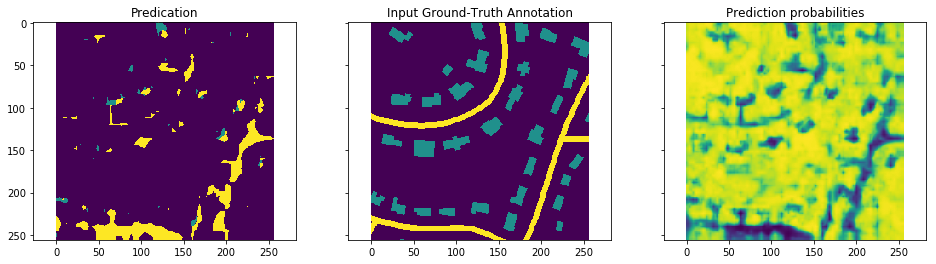

Epoch: 72 	Train step: 219 	Traing Loss: 0.271867 	mIOU: 0.367784


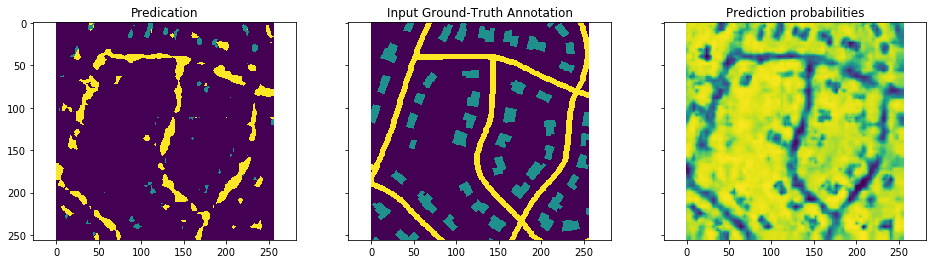

Epoch: 73 	Train step: 222 	Traing Loss: 0.328296 	mIOU: 0.368779


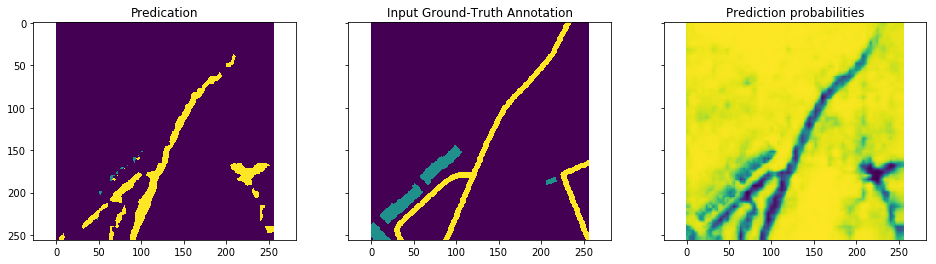

Epoch: 74 	Train step: 225 	Traing Loss: 0.312134 	mIOU: 0.369654


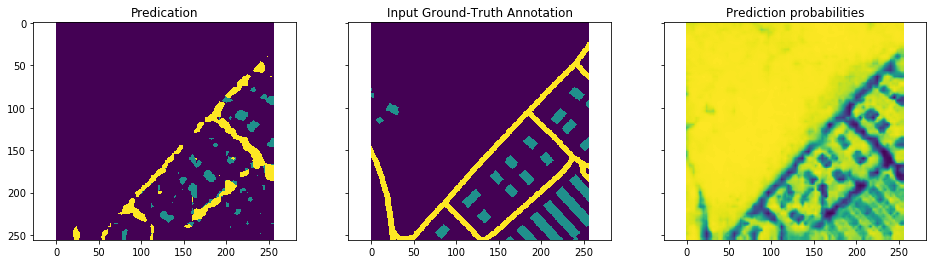

Epoch: 75 	Train step: 228 	Traing Loss: 0.311886 	mIOU: 0.370721


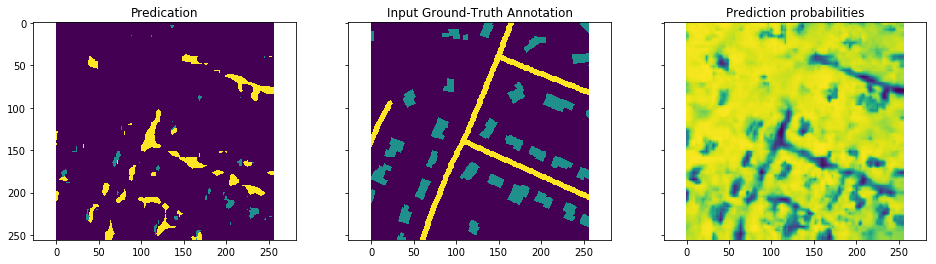

Epoch: 76 	Train step: 231 	Traing Loss: 0.382829 	mIOU: 0.371515


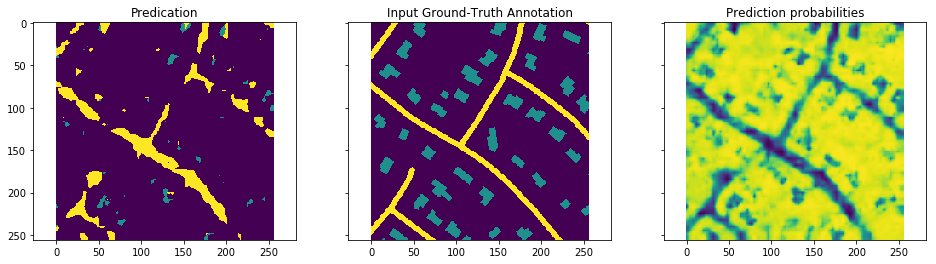

Epoch: 77 	Train step: 234 	Traing Loss: 0.345656 	mIOU: 0.372506


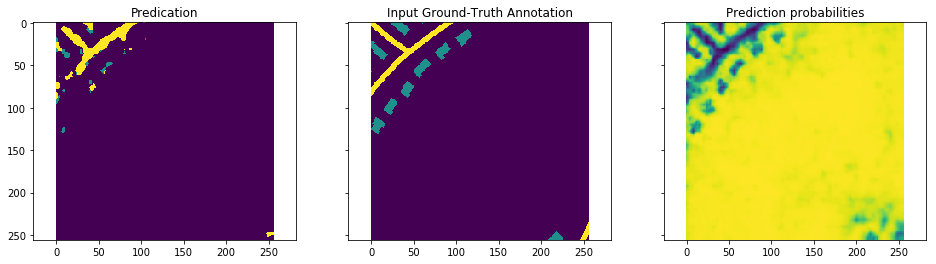

Epoch: 78 	Train step: 237 	Traing Loss: 0.355249 	mIOU: 0.373296


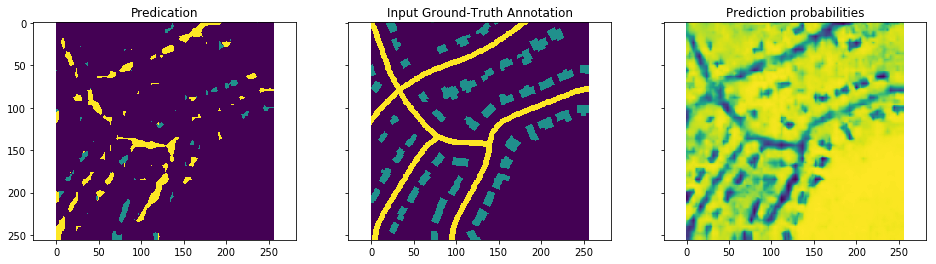

Epoch: 79 	Train step: 240 	Traing Loss: 0.360356 	mIOU: 0.374222


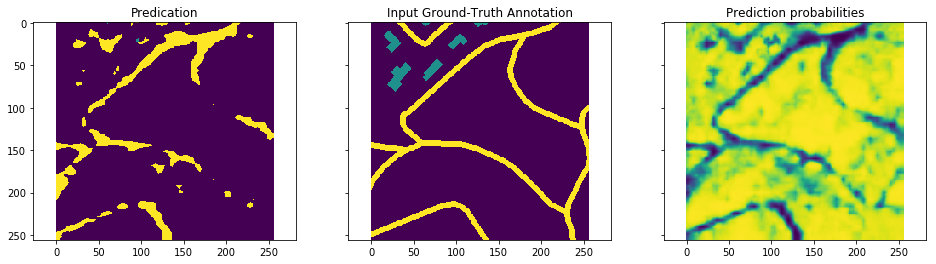

Epoch: 80 	Train step: 243 	Traing Loss: 0.340029 	mIOU: 0.375335


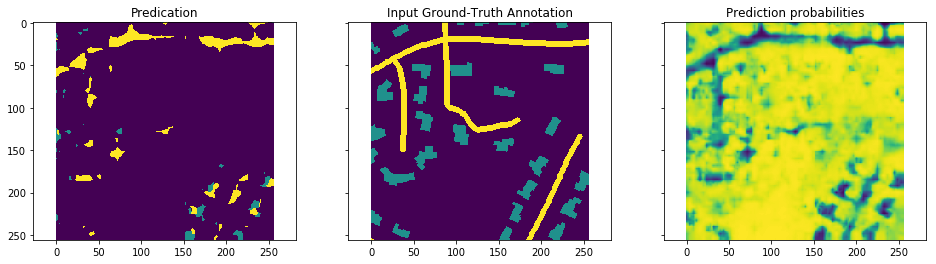

Epoch: 81 	Train step: 246 	Traing Loss: 0.349664 	mIOU: 0.376214


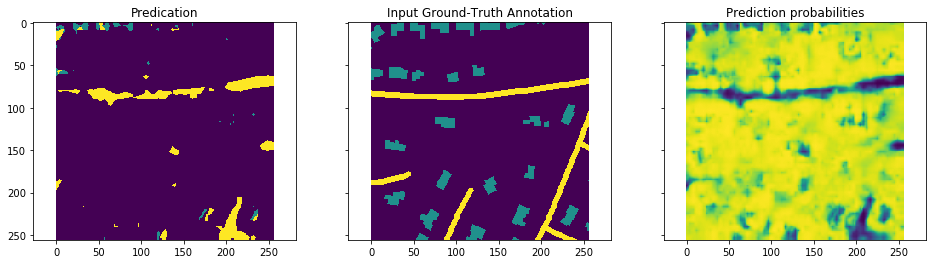

Epoch: 82 	Train step: 249 	Traing Loss: 0.339533 	mIOU: 0.377341


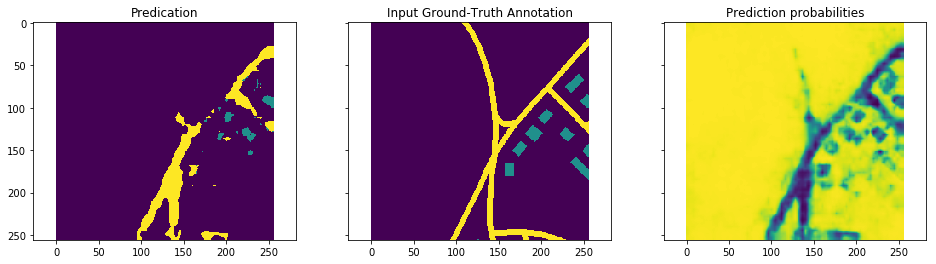

Epoch: 83 	Train step: 252 	Traing Loss: 0.349002 	mIOU: 0.378184


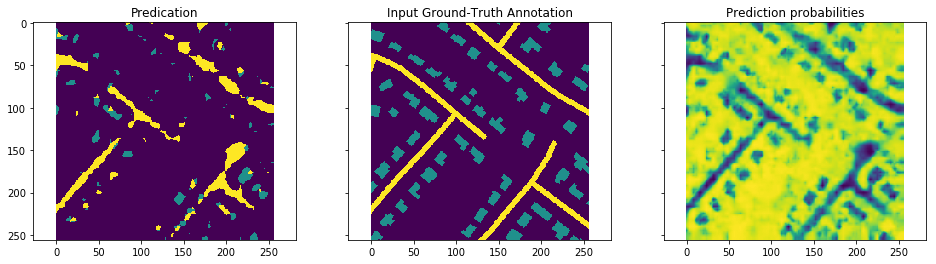

Epoch: 84 	Train step: 255 	Traing Loss: 0.321451 	mIOU: 0.379195


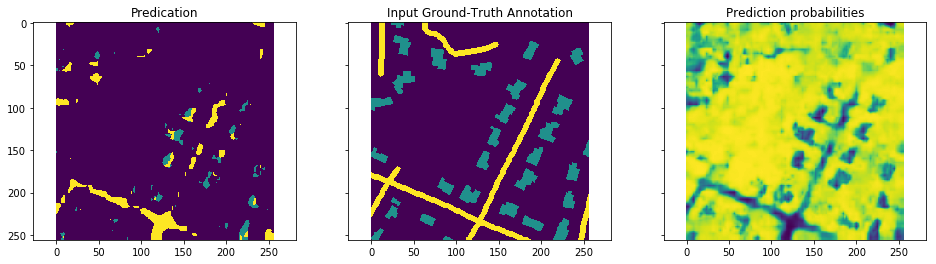

Epoch: 85 	Train step: 258 	Traing Loss: 0.327792 	mIOU: 0.379958


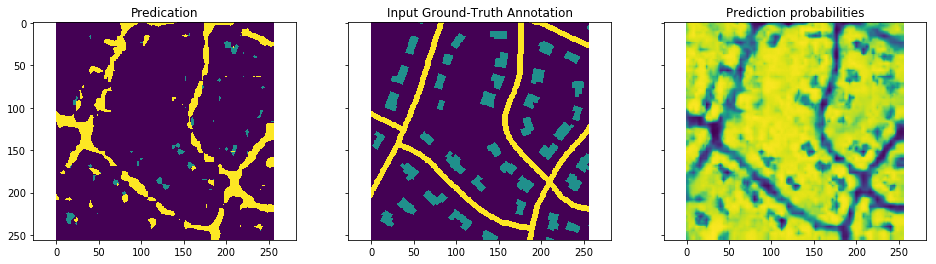

Epoch: 86 	Train step: 261 	Traing Loss: 0.314647 	mIOU: 0.381032


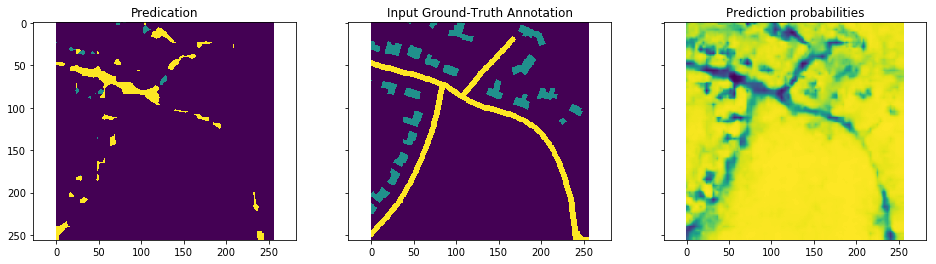

Epoch: 87 	Train step: 264 	Traing Loss: 0.347987 	mIOU: 0.381945


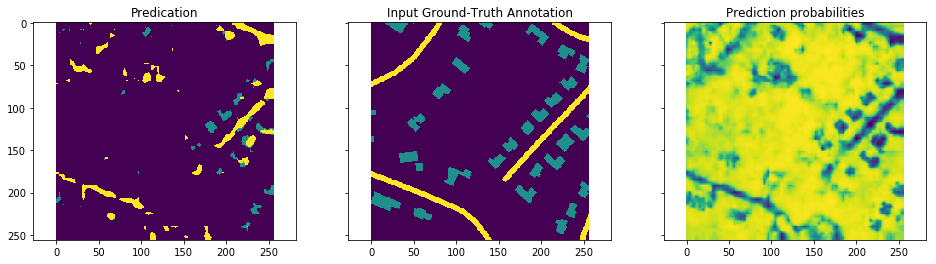

Epoch: 88 	Train step: 267 	Traing Loss: 0.355299 	mIOU: 0.383048


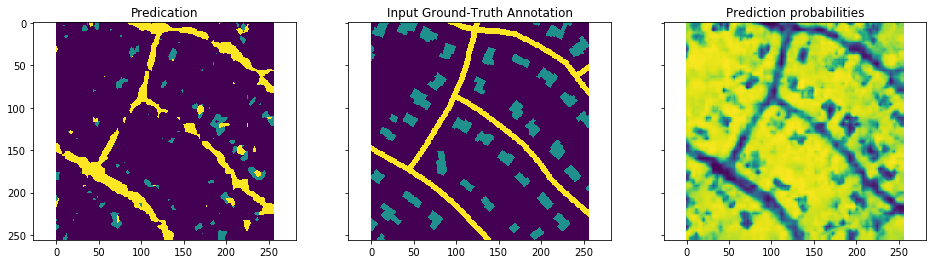

Epoch: 89 	Train step: 270 	Traing Loss: 0.305591 	mIOU: 0.384122


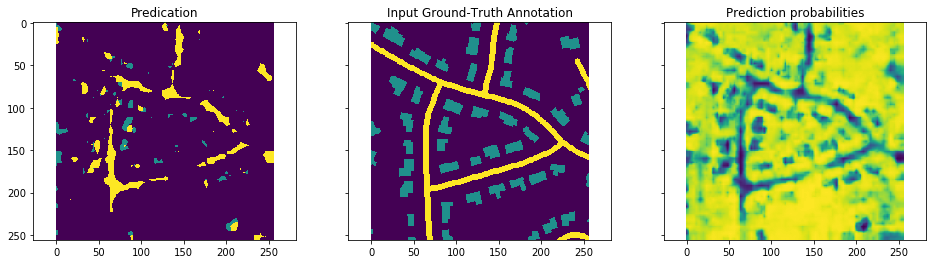

Epoch: 90 	Train step: 273 	Traing Loss: 0.32771 	mIOU: 0.384932


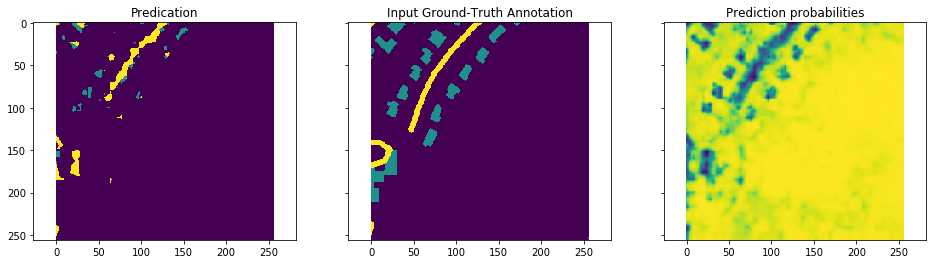

Epoch: 91 	Train step: 276 	Traing Loss: 0.354119 	mIOU: 0.385716


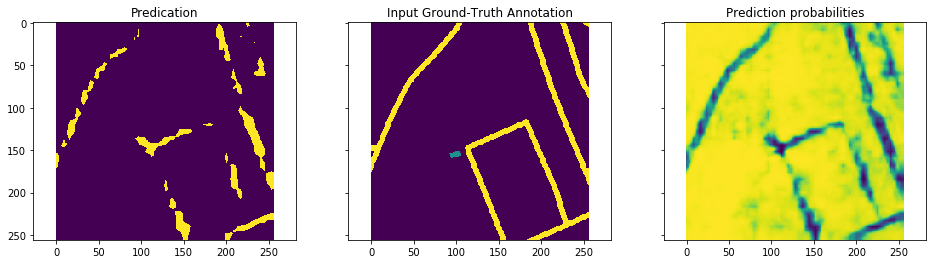

Epoch: 92 	Train step: 279 	Traing Loss: 0.289325 	mIOU: 0.386557


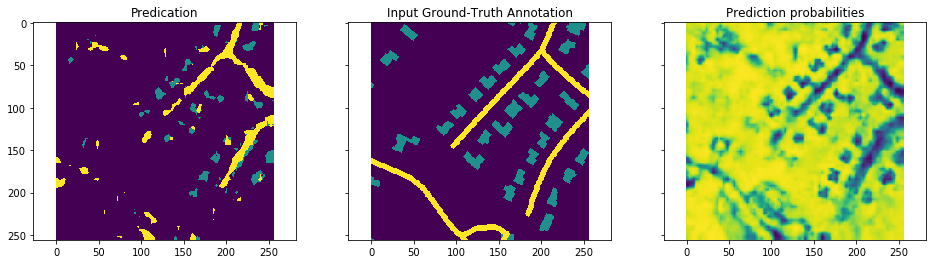

Epoch: 93 	Train step: 282 	Traing Loss: 0.348743 	mIOU: 0.387485


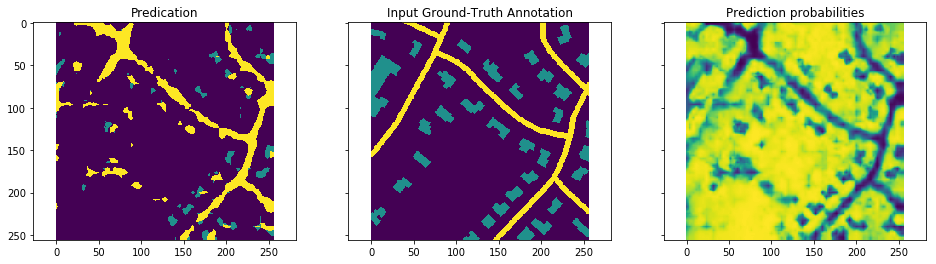

Epoch: 94 	Train step: 285 	Traing Loss: 0.36106 	mIOU: 0.388385


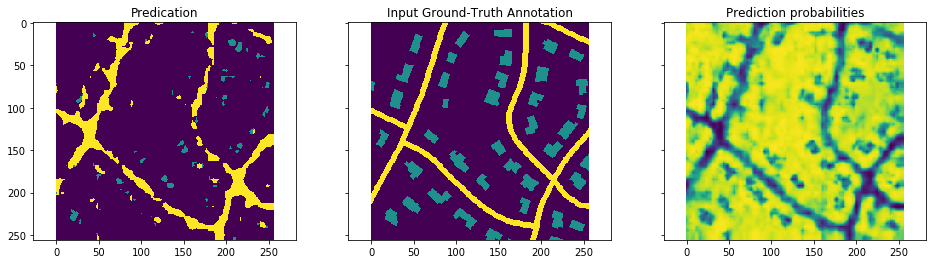

Epoch: 95 	Train step: 288 	Traing Loss: 0.327823 	mIOU: 0.389367


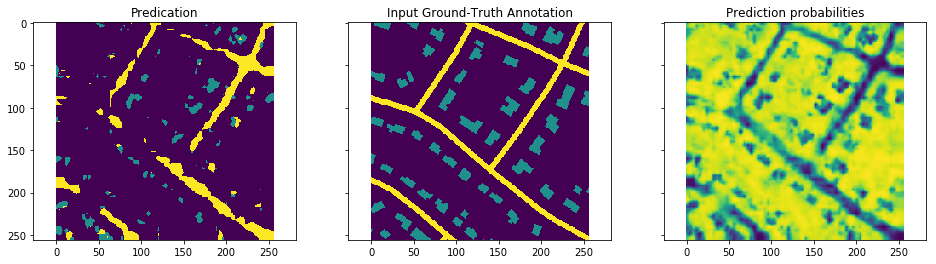

Epoch: 96 	Train step: 291 	Traing Loss: 0.331203 	mIOU: 0.390342


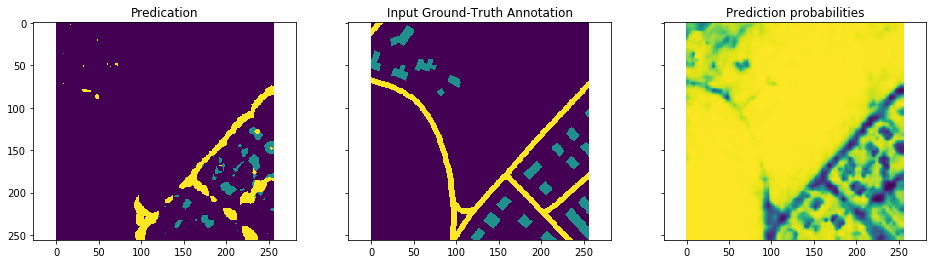

Epoch: 97 	Train step: 294 	Traing Loss: 0.349142 	mIOU: 0.391308


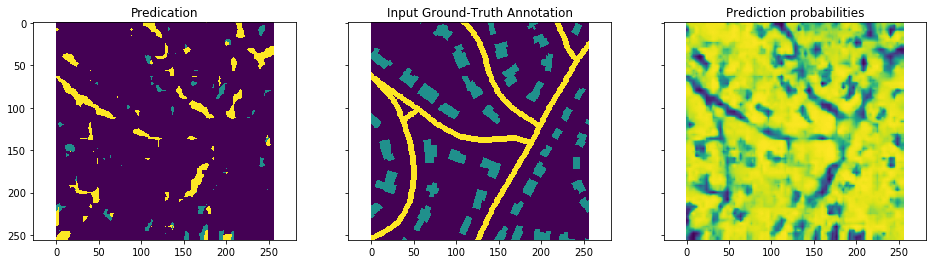

Epoch: 98 	Train step: 297 	Traing Loss: 0.344755 	mIOU: 0.392187


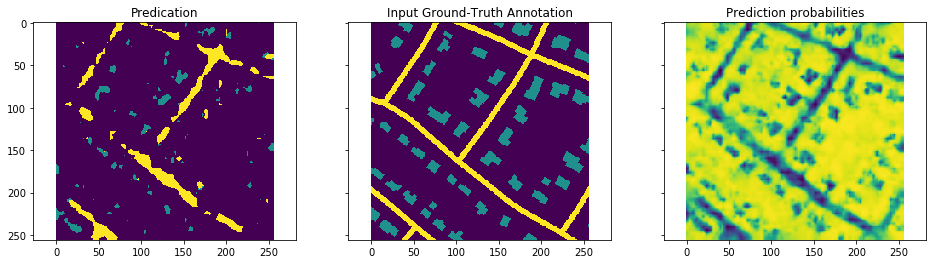

Epoch: 99 	Train step: 300 	Traing Loss: 0.316438 	mIOU: 0.392986


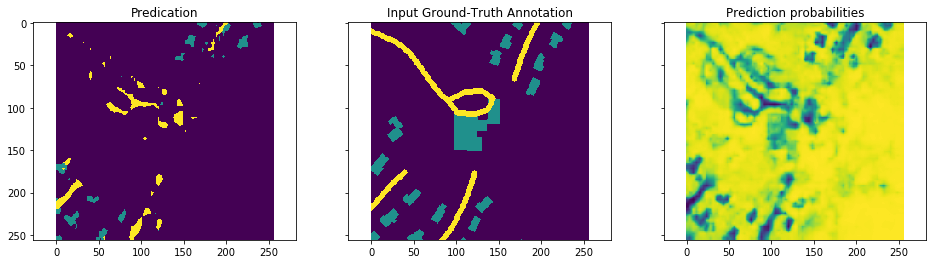

In [17]:
# Initializer for new fc8 weights -- for two classes.
vgg_fc8_weights_initializer = tf.variables_initializer(vgg_fc8_weights)

# Initializer for adam variables
optimization_variables_initializer = tf.variables_initializer(adam_optimizer_variables)

model_vars = tf.variables_initializer(model_variables)

# Create a saver.
saver = tf.train.Saver()
crop_size = 256

with tf.Session() as sess:
    
    # Run the initializers.
    read_vgg_weights_except_fc8_func(sess)
    sess.run(vgg_fc8_weights_initializer)
    sess.run(optimization_variables_initializer)
    sess.run(tf.local_variables_initializer())
    sess.run(model_vars)
    step = 0
    
    for epoch in range(100):
    
        for batch_image, batch_annotations in next_batch(train_images_dir, train_annotations_dir, images_filenale_list, 32, crop_size):

            _, train_loss, pred_np, probabilities_np, tmp = sess.run([train_step, cross_entropy, pred, probabilities, update_op],
                                            feed_dict={is_training_placeholder: True,
                                                      batch_images_placeholder:batch_image,
                                                      batch_labels_placeholder:batch_annotations})
            step += 1
            
        miou_np = sess.run(miou)

        print("Epoch:", epoch, "\tTrain step:", step, "\tTraing Loss:", train_loss, "\tmIOU:", miou_np)

        cmap = plt.get_cmap('bwr')
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True)
        f.set_figheight(4)
        f.set_figwidth(16)

        ax1.imshow(pred_np[0])
        ax1.set_title('Predication')
        probability_graph = ax2.imshow(batch_annotations[0])
        ax2.set_title('Input Ground-Truth Annotation')
        probability_graph = ax3.imshow(probabilities_np[0].squeeze()[:, :, 0])
        ax3.set_title('Prediction probabilities')
        plt.show()

    summary_string_writer.close()